In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


###Project Code

In [2]:
%cd /content/drive/MyDrive/Computer Vision/CIS_5810_Final_Project

/content/drive/MyDrive/Computer Vision/CIS_5810_Final_Project


In [ ]:
!pip install ffmpeg

  Preparing metadata (setup.py) ... done
  Created wheel for ffmpeg: filename=ffmpeg-1.4-py3-none-any.whl size=6082 sha256=76f8df297fb5453afc2bc0415a6e7964245929e926e064fe1bdadf9641856fae
  Stored in directory: /root/.cache/pip/wheels/8e/7a/69/cd6aeb83b126a7f04cbe7c9d929028dc52a6e7d525ff56003a
Successfully built ffmpeg


In [ ]:
!du -hs extracted_frames

16G	extracted_frames


###Extract frames from .tar files

In [ ]:
import tarfile
import os

directory = '240P'
output_directory = 'extracted_frames'
for filename in sorted(os.listdir(directory)):
    f = os.path.join(directory, filename)
    modified_f = os.path.join(output_directory, filename.replace('.tar', ''))
    with tarfile.open(f, 'r') as tar:
        if (os.path.isdir(modified_f)==False):
            tar.extractall('extracted_frames/')
        elif (len(tar.getmembers()) != len(os.listdir(modified_f))-1):
          tar.extractall('extracted_frames/')

###Convert key frames to videos

In [ ]:
import cv2
import os

#modify path and loop to save all videos
image_folder = 'extracted_frames/tt0032138'
video_name = 'video.avi'

images = [img for img in os.listdir(image_folder) if img.endswith(".png")]
frame = cv2.imread(os.path.join(image_folder, images[0]))
height, width, layers = frame.shape

video = cv2.VideoWriter(video_name, 0, 1, (width,height))

for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))

cv2.destroyAllWindows()
video.release()

In [ ]:
import ffmpeg
(
    ffmpeg
    #modify path
    .input('/path/to/jpegs/*.jpg', pattern_type='glob', framerate=25)
    .output('movie.mp4')
    .run()
)

###Display video in Google Colab

In [ ]:
import imageio.v3 as iio
from pathlib import Path

images = list()
for file in sorted(Path("extracted_frames/tt0032138").iterdir()):
    if not file.is_file():
        continue

    images.append(iio.imread(file))

In [ ]:
import imageio
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from skimage.transform import resize
from IPython.display import HTML

def display_video(video):
    fig = plt.figure(figsize=(3,3))  #Display size specification

    mov = []
    for i in range(len(video)):  #Append videos one by one to mov
        img = plt.imshow(video[i], animated=True)
        plt.axis('off')
        mov.append([img])

    #Animation creation
    anime = animation.ArtistAnimation(fig, mov, interval=200, repeat_delay=1000)

    plt.close()
    return anime

In [ ]:
video = images  #Loading video
#video = [resize(frame, (256, 256))[..., :3] for frame in video]    #Size adjustment (if necessary)
HTML(display_video(video).to_html5_video())  #Inline video display in HTML5

###Display video locally

In [ ]:
import cv2

#modify path
video_path = 'extracted_videos/my_video.mp4'
cap = cv2.VideoCapture(video_path)

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Process the frame (e.g., resize, apply filters, etc.)
    # ...

    cv2.imshow('Video', frame)
    if cv2.waitKey(1) == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

In [ ]:
from moviepy.editor import VideoFileClip

#modify path
clip = VideoFileClip('extracted_videos/my_video.mp4')
clip = clip.subclip(10, 20)  # Trim the video
clip.write_videofile('output.mp4')

###Feature Extraction using CLIP

In [3]:
import torch
from PIL import Image
from transformers import CLIPProcessor, CLIPModel


def get_best_clip_match(image, descriptions):
    """
    Uses CLIP to find the best matching description for an image.

    Parameters:
        image_path (str): Path to the image file.
        descriptions (list): List of text descriptions to match against the image.

    Returns:
        str: The best matching description.
    """
    # Load the CLIP model and processor
    model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
    processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

    # Load the image
    # image = Image.open(image_path)

    # Pre-process the image and descriptions
    inputs = processor(text=descriptions, images=image, return_tensors="pt", padding=True)

    # Perform inference
    outputs = model(**inputs)
    logits_per_image = outputs.logits_per_image  # Image-text similarity
    probs = logits_per_image.softmax(dim=1)  # Convert to probabilities

    # Get the best-matching description
    best_match_idx = torch.argmax(probs).item()
    return descriptions[best_match_idx]

def get_descriptions(image_path):

    # Prepare text descriptions (you can modify these as needed)
    scene_types = [
 # Action and Adventure Scenes
        "scene of a superhero movie", "scene of an epic adventure", "scene of a spy thriller",
        "scene of a car chase", "scene of a heist movie", "scene of a martial arts movie",
        "scene of a survival adventure", "scene of a treasure hunt", "scene of a jungle expedition",
        "scene of a daring rescue", "scene of a post-apocalyptic world", "scene of a war movie",
        "scene of a naval battle", "scene of an air combat movie", "scene of a Western movie", "scene of a pirate movie",
        "scene of a historical war drama", "scene of an epic journey", "scene of an explosive finale",
        "scene of sea voyage", "scene of a desert survival", "scene of a hero's sacrifice",

        # Sci-Fi and Futuristic Scenes
        "scene of a sci-fi movie", "scene of a space exploration movie", "scene of a dystopian world",
        "scene of a futuristic city", "scene of an alien invasion", "scene of a robot uprising",
        "scene of a cyberpunk world", "scene of a virtual reality movie", "scene of a galactic war", "scene of an advanced AI thriller",
        "scene of a futuristic utopia", "scene of a terraforming mission", "scene of a cryogenic awakening",
        "scene of a biotechnological experiment", "scene of a planetary colonization",
        "scene of a black hole discovery", "scene of an interstellar mission", "scene of a space battle",  "scene of a first alien contact",

        # Fantasy and Magical Scenes
        "scene of a fantasy movie", "scene of a magical adventure", "scene of a mythological story",
        "scene of a hero's quest", "scene of a magical kingdom", "scene of an enchanted forest",
        "scene of a mystical journey", "scene of a fairy tale", "scene of a cursed land",

        # Romantic Scenes
        "scene of a romantic movie", "scene of a romantic comedy", "scene of a love story",
        "scene of a historical romance", "scene of a tragic romance",
        "scene of a first love", "scene of a romantic getaway", "scene of a romantic tragedy",

        # Comedy Scenes
        "scene of a comedy movie", "scene of a slapstick comedy", "scene of a dark comedy",
        "scene of a parody movie", "scene of a family-friendly comedy", "scene of a buddy comedy",
        "scene of a workplace comedy", "scene of a road trip comedy", "scene of a hilarious heist",

        # Horror and Thriller Scenes
        "scene of a horror movie", "scene of a supernatural horror", "scene of a haunted house",
        "scene of a psychological thriller", "scene of a zombie apocalypse", "scene of a murder mystery",
        "scene of a slasher movie", "scene of a monster movie", "scene of a cursed object",
        "scene of a ghost story", "scene of a paranormal investigation", "scene of a creepy forest",
        "scene of a creature stalking its prey", "scene of a foggy graveyard",

        # Historical and Period Scenes
        "scene of a historical movie", "scene of a period drama", "scene of a royal court",
        "scene of a medieval battle", "scene of an empire's fall", "scene of a historical romance",
        "scene of a samurai duel", "scene of an ancient myth", "scene of a pharaoh's tomb",
        "scene of a great discovery", "scene of an artist's masterpiece", "scene of a Renaissance festival",
        "scene of a colonial settlement", "scene of a revolutionary uprising", "scene of a historical speech",
        "scene of a medieval feast", "scene of a great fire", "scene of a legendary king's court",

        # Crime and Mystery Scenes
        "scene of a crime movie", "scene of a detective story", "scene of a police procedural",
        "scene of a courtroom drama", "scene of a true crime story", "scene of a heist movie",
        "scene of a noir thriller", "scene of a murder investigation", "scene of a psychological crime drama",
        "scene of a political conspiracy", "scene of a prison escape",

        # Sports Scenes
        "scene of a sports movie", "scene of a championship game", "scene of a team training montage",
        "scene of a dramatic game-winning moment", "scene of a team celebrating after a win", "scene of a bitter defeat",

        # Documentary Scenes
        "scene of a wildlife documentary", "scene of a nature documentary", "scene of a historical documentary",
        "scene of a true crime documentary", "scene of a cultural documentary", "scene of a biographical documentary",
        "scene of a scientific exploration", "scene of an environmental crisis", "scene of a space exploration documentary",
        "scene of a documentary about art", "scene of a groundbreaking discovery",

        # Musical and Dance Scenes
        "scene of a musical film", "scene of a dance movie", "scene of a concert performance",
        "scene of a Broadway musical", "scene of a historical musical", "scene of a romantic musical",
        "scene of a choir performance"
    ]

    emotions = [
        # Peaceful and Serene
        "a peaceful scene", "a serene atmosphere", "a tranquil setting", "a reflective mood",
        "a calming environment", "a harmonious scene", "a soothing atmosphere", "a meditative moment",
        "a restful setting", "a scene of quiet contentment", "a still and undisturbed moment",
        "a relaxing environment", "a blissful scene", "a sense of balance and order", "a scene of gentle beauty",

        # Excitement and Adventure
        "an exciting atmosphere", "a thrilling scene", "an adventurous setting", "a suspenseful moment",
        "a high-energy atmosphere", "a scene of daring and risk", "a heart-pounding moment",
        "an electrifying atmosphere", "a bold and audacious scene", "a sense of exploration",
        "a pulse-pounding sequence", "an exhilarating moment", "a fast-paced environment",
        "a scene filled with anticipation", "a dynamic and energetic moment",

        # Mystery and Suspense
        "a mysterious setting", "a tense atmosphere", "an ominous mood", "a foreboding scene",
        "a scene filled with intrigue", "an unsettling atmosphere", "a moment of lurking danger",
        "a shadowy and enigmatic setting", "a feeling of impending doom", "a puzzling and ambiguous mood",
        "a secretive and covert scene", "a mood of apprehension", "a scene shrouded in uncertainty",
        "a cryptic and haunting atmosphere", "a moment of dark anticipation",

        # Heroic and Grand
        "an epic/grand scene", "a majestic setting", "a heroic moment", "a powerful atmosphere",
        "a scene of great triumph", "a feeling of courage and bravery", "a scene filled with noble intentions",
        "a commanding and awe-inspiring moment", "a story of resilience and victory", "a setting of monumental scale",
        "a feeling of invincibility", "a moment of selfless sacrifice", "a triumphant and victorious scene",
        "a story of overcoming great odds", "a grand and sweeping view",

        # Sadness and Melancholy
        "a melancholic mood", "a sorrowful scene", "a somber atmosphere", "a heartbreaking moment",
        "a sense of profound loss", "a wistful and longing mood", "a tearful and emotional scene",
        "a mood of quiet despair", "a scene of mourning and grief", "a tragic and poignant moment",
        "a setting of desolation and loneliness", "a mood of bittersweet memories", "a quiet and introspective moment",
        "a feeling of heavy sadness", "a solemn and reflective atmosphere",

        # Romantic and Intimate
        "a romantic scene", "an intimate atmosphere", "a loving mood", "a passionate setting",
        "a moment of deep connection", "a tender and caring atmosphere", "a heartfelt and emotional moment",
        "a warm and affectionate scene", "a dreamy and enchanting atmosphere", "a moment of undeniable chemistry",
        "a story of unspoken feelings", "a setting filled with love and devotion", "a scene of playful flirting",
        "a mood of undying loyalty", "a magical and captivating moment",

        # Fear and Horror
        "a terrifying scene", "a fearful atmosphere", "a spine-chilling mood", "an anxiety-inducing setting",
        "a moment of abject terror", "a setting filled with dread", "a story of pure horror",
        "a sinister and malevolent atmosphere", "a suspenseful and nerve-wracking moment",
        "a nightmarish and haunting mood", "a setting of overwhelming fear", "a moment of sheer panic",
        "a story of confronting primal fears", "a menacing and predatory mood", "a shadowy and oppressive atmosphere",

        # Chaos and Disorder
        "a chaotic/frantic setting", "a disordered scene", "a hectic atmosphere", "an out-of-control moment",
        "a story filled with confusion and turmoil", "a scene of overwhelming chaos", "a moment of total anarchy",
        "a frenzied and wild setting", "a mood of reckless abandon", "a setting of complete disorder",
        "a frantic and unrelenting pace", "a mood of barely controlled panic", "a story of desperate survival",
        "a moment of spiraling chaos", "a scene of uncontrollable events",

        # Joy and Celebration
        "a joyous atmosphere", "a celebratory mood", "a cheerful scene", "a playful moment",
        "a story filled with laughter and happiness", "a scene of unbridled joy", "a setting of communal celebration",
        "a moment of lighthearted fun", "a mood of carefree bliss", "a festive and jubilant atmosphere",
        "a heartwarming and delightful story", "a setting of shared happiness", "a scene of childlike wonder",
        "a moment of pure elation", "a mood of contented laughter",

        # Hope and Inspiration
        "a hopeful scene", "an inspirational atmosphere", "a scene filled with optimism", "a moment of resilience",
        "a story of overcoming adversity", "a setting of new beginnings", "a mood of determined perseverance",
        "a scene of unshakable faith", "a story of redemption and hope", "a setting of limitless possibilities",
        "a moment of profound encouragement", "a story of boundless potential", "a mood of unyielding determination",
        "a setting filled with promise", "a triumphant and uplifting scene"
    ]

    characters = [
        # Solo Character Configurations
        "solo character (single person scene)",
        "close-up of a solo character",
        "extreme close-up of a single character's face",
        "wide shot of a single character in a vast space",
        "silhouette of a lone figure against the light",
        "single character centered in the frame",
        "solo character off-center in the frame",
        "character seen from behind",
        "character in profile view",
        "over-the-shoulder shot of a character",
        "solo character from a high angle (bird's eye view)",
        "solo character from a low angle (worm's eye view)",
        "character framed by a doorway or window",
        "solo character partially obscured by shadows",
        "character reflected in a mirror or surface",

        # Two-Character Configurations
        "two characters (dual interaction)",
        "two characters standing side by side",
        "two characters facing each other",
        "two characters in profile facing outward",
        "two characters walking together",
        "two characters sitting across from each other",
        "two characters in a symmetrical composition",
        "one character in the foreground, one in the background",
        "two characters framed within a doorway",
        "two characters leaning toward each other",
        "two characters in a back-to-back pose",

        # Three-Character Configurations
        "three characters (triangular arrangement)",
        "three characters forming a line",
        "three characters forming a triangle",
        "three characters in a balanced composition",
        "one character flanked by two others",
        "three characters in a stacked composition (foreground, middle, background)",
        "three characters spaced evenly across the frame",
        "two characters interacting while one observes",
        "three characters aligned diagonally",
        "three characters partially overlapping each other",
        "one central character with two on opposite sides",
        "three characters forming a curve",
        "three characters facing outward from the center",
        "three characters placed asymmetrically",
        "three characters from a top-down view",

        # Group Scenes
        "group scene (four or more characters)",
        "a group of characters forming a circle",
        "a group in a loose, scattered arrangement",
        "a group lined up in a row",
        "a group creating depth through staggered positions",
        "a tightly packed group",
        "a group with one character prominently in focus",
        "a group symmetrically arranged",
        "a group in a V-shaped composition",
        "a group seen from an elevated angle",
        "a group viewed from a low angle",
        "a group fanning out in a semi-circle",
        "a group forming a straight diagonal line",
        "a cluster of characters with overlapping figures",
        "a group forming concentric circles",
        "a group with clear leader-follower dynamics",
        "a group placed in a spiral arrangement",
        "a group with significant negative space around them",
        "a group divided into two distinct halves",
        "a group of characters blending into the background",

        # No Characters
        "no characters (environment only)",
        "empty foreground with focus on the background",
        "scene composed entirely of negative space",
        "a symmetrical environment with no inhabitants",
        "an environment with leading lines to an empty center",
        "an overhead shot of a desolate area",
        "a wide shot emphasizing emptiness",
        "a close-up of an uninhabited detail",
        "an off-center composition of an empty space",
        "an extreme long shot of a barren landscape"
    ]

    best_match_type = get_best_clip_match(image_path, scene_types)
    best_match_emotion = get_best_clip_match(image_path, emotions)
    best_match_character = get_best_clip_match(image_path, characters)
    description = f"This is a {best_match_type}, There is/are {best_match_character}, \n The mood description of it is {best_match_emotion}"

    # print (description)

    return (best_match_type, best_match_emotion, best_match_character, description)

###Color Extraction using K-Means

In [4]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

def extract_colors(image, n_colors=5):
    # Load image and convert to RGB
    # image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Reshape the image to a 2D array of pixels
    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)

    # Use KMeans to cluster the colors
    kmeans = KMeans(n_clusters=n_colors)
    kmeans.fit(pixel_values)

    # Get the dominant colors
    centers = np.uint8(kmeans.cluster_centers_)
    labels = kmeans.labels_

    """
    # Display the colors
    plt.figure()
    plt.imshow([centers])
    plt.axis("off")
    plt.show()
    """
    color_text = f"Dominant colors are:\n {centers}"
    #print(color_text)

    return centers,color_text

###Using OpenAI API to generate prompt

In [ ]:
from openai import OpenAI
from PIL import Image
from keys import openai_api_key


client = OpenAI(
    api_key=openai_api_key
)

def generate_chat(prompt):

    # Call the OpenAI API to generate the task
    response = client.chat.completions.create(
        model="gpt-4",
        messages= [
            {"role": "system", "content": "You are a helpful assistant."},
            {"role" : "user", "content" : prompt}
            ],
        max_tokens=300,
        temperature=0.7,
    )

    # Extract the generated task from the response
    response = response.choices[0].message.content

    return response


# Load the image
image_path = "sample_images/sample_1.jpg"

type,emotion,character,description = get_descriptions(image_path)
color,color_text = extract_colors(image_path)


test_prompt = f"""
Based on the following description below, can you guess which movie this is or suggest some movies that might match its aesthetic feelings?\n
{description}, {color_text}.
"""

response = generate_chat(test_prompt)

print(response)

###Extract brightness and contrast of image

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def brightness_contrast(image):
    if image is None:
        print("Error: Unable to load image.")
    else:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        brightness = np.mean(image_rgb)
        contrast = np.std(image_rgb)
        return brightness, contrast

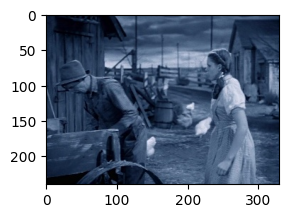

Brightness: 78.87
Contrast: 47.20


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = "extracted_frames/tt0032138/shot_0010_img_1.jpg"
image = cv2.imread(image_path)

#visualize image input
brightness, contrast = brightness_contrast(image)
fig = plt.figure(figsize=(3,3))
plt.imshow(image)
plt.show()

print(f"Brightness: {brightness:.2f}")
print(f"Contrast: {contrast:.2f}")

###Extract image and text embeddings

In [6]:
import numpy as np
import torch
import torchvision
from PIL import Image
from torch import nn
from torchvision import transforms as tr
from transformers import CLIPModel, CLIPProcessor, CLIPTokenizer
#from torchvision.models import vit_h_14


class imageEmbeddings:
    """Class tasked with extracting image embeddings """
    def __init__(self, image, device, processor, model):
        self.image = image
        self.device = device
        self.processor = processor
        self.model = model


    # def process_test_image(self, image_path):
    #     """Processing images
    #     Parameters
    #     ----------
    #     image_path :str

    #     Returns
    #     -------
    #     Processed image : str
    #     """
    #     img = Image.open(image_path)
    #     transformations = tr.Compose([tr.ToTensor(),
    #                                     tr.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    #                                     tr.Resize((518, 518))])
    #     img = transformations(img).float()
    #     img = img.unsqueeze_(0)

    #     img = img.to(self.device)

    #     return img

    def get_embeddings(self):
        #img = self.process_test_image(self.image_path_1)
        img = self.image
        processed_img = self.processor(text = None, images=img, return_tensors="pt")["pixel_values"].to(self.device)
        embedding = self.model.get_image_features(processed_img)
        embedding_as_np = embedding.cpu().detach().numpy()

        return embedding_as_np

In [7]:
import numpy as np
import torch
import torchvision
from PIL import Image
from torch import nn
from torchvision import transforms as tr
from transformers import CLIPModel, CLIPProcessor, CLIPTokenizer

class textEmbeddings:
    def __init__(self, text, device, tokenizer, model):
        self.text = text
        self.device = device
        self.tokenizer = tokenizer
        self.model = model

    def get_embeddings(self):
        inputs = self.tokenizer(self.text, return_tensors = "pt").to(self.device)
        text_embeddings = self.model.get_text_features(**inputs)
        embedding_as_np = text_embeddings.cpu().detach().numpy()

        return embedding_as_np

###Initializing the model

In [8]:
import csv
import pandas as pd
import os
import cv2
import numpy as np
import torch
import torchvision
from torch import nn
from torchvision import transforms as tr
from transformers import CLIPModel, CLIPProcessor, CLIPTokenizer


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-base-patch32")
model = model.to(device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

###Creating dataset of image embeddings and extracted features

In [ ]:
with open('features.csv', 'w') as csvfile:
        csvwriter = csv.writer(csvfile)
        csvwriter.writerow(["frame", "image_embedding", "brightness", "contrast", "scene_type", "emotion", "character", "description", "color"])

In [ ]:
def create_dataset(frames_folder, output_csv, labels=None):
    #df = pd.DataFrame(columns=["frame", "image_embedding", "brightness", "contrast", "scene_type", "emotion", "character", "description", "color"])
    movies = sorted([os.path.join(frames_folder, folder) for folder in os.listdir(frames_folder)])

    with open(output_csv, 'a', buffering=1) as csvfile:
        csvwriter = csv.writer(csvfile)

        for movie in movies:
            frame_files = [os.path.join(movie, f) for f in os.listdir(movie) if f.endswith("_img_1.jpg")]
            #randomly pick 256 frames from frame_files
            frame_files = np.random.choice(frame_files, size=256, replace=False)

            for i, frame_file in enumerate(frame_files):
                #Extract image embeddings and other features
                image = cv2.imread(frame_file)
                image_embedding = imageEmbeddings(image, device, processor, model).get_embeddings()
                brightness, contrast = brightness_contrast(image)
                scene_type,emotion,characters,description = get_descriptions(image)
                scene_type = textEmbeddings(scene_type, device, tokenizer, model).get_embeddings()
                emotion = textEmbeddings(emotion, device, tokenizer, model).get_embeddings()
                characters = textEmbeddings(characters, device, tokenizer, model).get_embeddings()
                description = textEmbeddings(description, device, tokenizer, model).get_embeddings()
                color,color_text = extract_colors(image)
                csvwriter.writerow([os.path.join(os.path.basename(movie), os.path.basename(frame_file)), image_embedding, brightness, contrast, scene_type, emotion, characters, description, color])
                #df.loc[len(df)] = [image_embedding, brightness, contrast, scene_type, emotion, characters, description, color]
                print(f"Processed {i+1} frame in movie {movie}")
    return
    # Write to CSV
    # df.to_csv('output.csv', index=False)

In [ ]:
create_dataset("extracted_frames", "features.csv")

Processed 1 frame in movie extracted_frames/tt0032138
Processed 2 frame in movie extracted_frames/tt0032138
Processed 3 frame in movie extracted_frames/tt0032138
Processed 4 frame in movie extracted_frames/tt0032138
Processed 5 frame in movie extracted_frames/tt0032138
Processed 6 frame in movie extracted_frames/tt0032138
Processed 7 frame in movie extracted_frames/tt0032138
Processed 8 frame in movie extracted_frames/tt0032138
Processed 9 frame in movie extracted_frames/tt0032138
Processed 10 frame in movie extracted_frames/tt0032138
Processed 11 frame in movie extracted_frames/tt0032138
Processed 12 frame in movie extracted_frames/tt0032138
Processed 13 frame in movie extracted_frames/tt0032138
Processed 14 frame in movie extracted_frames/tt0032138
Processed 15 frame in movie extracted_frames/tt0032138
Processed 16 frame in movie extracted_frames/tt0032138
Processed 17 frame in movie extracted_frames/tt0032138
Processed 18 frame in movie extracted_frames/tt0032138
Processed 19 frame 

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


Processed 238 frame in movie extracted_frames/tt0032138
Processed 239 frame in movie extracted_frames/tt0032138
Processed 240 frame in movie extracted_frames/tt0032138
Processed 241 frame in movie extracted_frames/tt0032138
Processed 242 frame in movie extracted_frames/tt0032138
Processed 243 frame in movie extracted_frames/tt0032138
Processed 244 frame in movie extracted_frames/tt0032138
Processed 245 frame in movie extracted_frames/tt0032138
Processed 246 frame in movie extracted_frames/tt0032138
Processed 247 frame in movie extracted_frames/tt0032138
Processed 248 frame in movie extracted_frames/tt0032138
Processed 249 frame in movie extracted_frames/tt0032138
Processed 250 frame in movie extracted_frames/tt0032138
Processed 251 frame in movie extracted_frames/tt0032138
Processed 252 frame in movie extracted_frames/tt0032138
Processed 253 frame in movie extracted_frames/tt0032138
Processed 254 frame in movie extracted_frames/tt0032138
Processed 255 frame in movie extracted_frames/tt

KeyboardInterrupt: 

###Data preprocessing

In [9]:
def data_preprocessing(list_like_object):
    list_like_object = list_like_object[1:-1]  # Remove outer brackets
    rows = list_like_object.split(']')  # Split into rows
    list_of_lists = []
    for row in rows:
        elements = row.strip('[ ').split()  # Split into elements
        if elements:
            list_of_lists.append([float(element) for element in elements])  #Convert elements to floats.
    numpy_array = np.array(list_of_lists)
    return numpy_array

In [10]:
import re

def data_preprocessing_color(list_like_object):
    list_like_object = list_like_object[1:-1]  # Remove outer brackets
    rows = [row for row in list_like_object.split(']') if row.strip()] # Split into rows
    list_of_lists = []
    for row in rows:
        row = re.sub(r"[^0-9]+", ' ', row)
        elements = [float(element) for element in row.strip('[\n').split() if element]  # Split into elements
        if elements:
            list_of_lists.append(elements)  #Convert elements to integers.
    numpy_array = np.array(list_of_lists)
    return numpy_array

In [11]:
def data_preprocessing_bc(list_like_object):
    return np.array([[list_like_object]])

In [12]:
# Data preprocessing
import pandas as pd
import re

image_data = pd.read_csv("features.csv")

image_data['frame'] = image_data['frame'].apply(lambda x: re.sub('\\\\','/',x))
for col in ["brightness","contrast"]:
      image_data[col] = image_data[col].apply(lambda x: data_preprocessing_bc(x))
for col in ["image_embedding", "scene_type","emotion","character","description"]:
      image_data[col] = image_data[col].apply(lambda x: data_preprocessing(x))
for col in ["color"]:
      image_data[col] = image_data[col].apply(lambda x: data_preprocessing_color(x))
image_data.head()

,frame,image_embedding,brightness,contrast,scene_type,emotion,character,description,color
0,tt0032138/shot_0573_img_1.jpg,"[[0.0180546194, -0.0280829594, -0.10503836, -0...",[[19.93071175278622]],[[21.397997134650925]],"[[0.150429085, 0.169681847, 0.176623389, -0.01...","[[0.106389135, 0.262158304, -0.13079977, 0.331...","[[-0.0786218345, 0.25965023, -0.17931287, 0.17...","[[0.132291168, 0.287908405, 0.129878908, -0.10...","[[26.0, 23.0, 21.0], [47.0, 44.0, 40.0], [8.0,..."
1,tt0032138/shot_0093_img_1.jpg,"[[-0.745608568, 0.0293291807, -0.210254952, 0....",[[90.26971462343803]],[[48.10849303445516]],"[[0.00109860301, 0.0865051448, 0.167743325, 0....","[[0.048011899, 0.019964844, 0.0382897556, 0.31...","[[-0.0786218345, 0.25965023, -0.17931287, 0.17...","[[0.00464847684, -0.00991598889, 0.0297215581,...","[[92.0, 82.0, 84.0], [183.0, 158.0, 174.0], [1..."
2,tt0032138/shot_0408_img_1.jpg,"[[-0.455771685, 0.0889052972, -0.265840054, 0....",[[49.57895136778116]],[[44.4924086058982]],"[[0.00109860301, 0.0865051448, 0.167743325, 0....","[[-0.255842447, 0.0892739594, -0.273389995, 0....","[[-0.0786218345, 0.25965023, -0.17931287, 0.17...","[[-0.0717837736, -0.016596742, 0.0188655853, -...","[[93.0, 73.0, 73.0], [144.0, 118.0, 130.0], [1..."
3,tt0032138/shot_0447_img_1.jpg,"[[-0.379794389, -0.0063611567, -0.342047632, -...",[[37.811757007767646]],[[40.23971552552947]],"[[-0.213954508, 0.131522864, 0.0831403136, 0.0...","[[-0.255842447, 0.0892739594, -0.273389995, 0....","[[-0.0032242462, 0.292485118, -0.400420785, -0...","[[-0.331010848, 0.187951148, -0.156517521, -0....","[[12.0, 8.0, 6.0], [80.0, 58.0, 49.0], [121.0,..."
4,tt0032138/shot_0595_img_1.jpg,"[[-0.383748025, 0.280433416, -0.0828732252, 0....",[[30.57710233029382]],[[36.68608435158582]],"[[0.00109860301, 0.0865051448, 0.167743325, 0....","[[0.048011899, 0.019964844, 0.0382897556, 0.31...","[[-0.0786218345, 0.25965023, -0.17931287, 0.17...","[[0.00464847684, -0.00991598889, 0.0297215581,...","[[12.0, 12.0, 9.0], [111.0, 101.0, 111.0], [38..."


In [13]:
# Put filenames in list
frames_list = image_data["frame"]
frames_list

,frame
0,tt0032138/shot_0573_img_1.jpg
1,tt0032138/shot_0093_img_1.jpg
2,tt0032138/shot_0408_img_1.jpg
3,tt0032138/shot_0447_img_1.jpg
4,tt0032138/shot_0595_img_1.jpg
...,...
8740,tt0064115/shot_0165_img_1.jpg
8741,tt0064115/shot_0363_img_1.jpg
8742,tt0064115/shot_0595_img_1.jpg
8743,tt0064115/shot_0043_img_1.jpg


In [ ]:
y = str(frames_list[0].split("\\")[0])
x = str(frames_list[0].split("\\")[1])
for i in os.listdir(os.path.join("extracted_frames", y)):
    if x in i:
        print(i)

shot_0573_img_1.jpg


###Matching images using Cosine Similarity

In [15]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import random

def get_top_N_images(frame, df, feature, feat_str, top_K=4):
   # Text to image Search
   query_vect = feature

   # Relevant columns
   revevant_cols = ["frame","image_embedding", "brightness","contrast","scene_type","emotion","character","description","color","cos_sim"]

   # Run similarity search
   # Initialize an empty list to store cosine similarities
   cos_sim_list = []

   # Iterate over rows of the DataFrame
   for index in df.index:
       # Extract embeddings and features for the current row
       #row_data = df.loc[index, ["image_embedding", "brightness", "contrast", "scene_type", "emotion", "character", "description"]].values
       row_data = df.iloc[index][feat_str]

       # Calculate cosine similarity
       if feat_str=="brightness" or feat_str=="contrast":
         cos_sim = np.dot(row_data, query_vect) / (np.linalg.norm(row_data) * np.linalg.norm(query_vect))
       else:
         cos_sim = cosine_similarity(query_vect, row_data)[0][0]

       cos_sim_list.append(cos_sim)

   # Assign the cosine similarities to a new column in the DataFrame
   df["cos_sim"] = cos_sim_list

   # Run similarity search
   # df["cos_sim"] = df[np.array(["image_embedding", "brightness","contrast","scene_type","emotion","character","description","color"])].apply(lambda x: cosine_similarity(query_vect, x))
   # df["cos_sim"] = df["cos_sim"].apply(lambda x: x[0][0])
   """
   Retrieve top_K (4 is default value) articles similar to the query
   """
   if feat_str=="character" or feat_str=="brightness" or feat_str=="contrast":
    x = random.randint(4, 20)
    most_similar_articles = df.sort_values(by='cos_sim',  ascending=False)[x:x+top_K+1]
   else:
    most_similar_articles = df.sort_values(by='cos_sim',  ascending=False)[1:top_K+1]
   return most_similar_articles[revevant_cols].reset_index()


In [14]:
def get_img_embeddings(df, frame):
    image = cv2.imread(os.path.join("extracted_frames", frame))
    img_embedding = imageEmbeddings(image, device, processor, model).get_embeddings()
    brightness, contrast = brightness_contrast(image)
    scene_type,emotion,characters,description = get_descriptions(image)
    scene_type = textEmbeddings(scene_type, device, tokenizer, model).get_embeddings()
    emotion = textEmbeddings(emotion, device, tokenizer, model).get_embeddings()
    characters = textEmbeddings(characters, device, tokenizer, model).get_embeddings()
    color,color_text = extract_colors(image)
    # img_embedding = np.squeeze(img_embedding)
    # scene_type = np.squeeze(scene_type)
    # emotion = np.squeeze(emotion)
    # characters = np.squeeze(characters)
    # description = np.squeeze(description)

    return img_embedding, brightness, contrast, scene_type, emotion, characters, description, color

###Visualizing results

In [16]:
def plot_images_by_side(top_images, description):
 index_values = list(top_images.index.values)
 list_images = [top_images.iloc[idx].frame for idx in index_values]
 similarity_score = [top_images.iloc[idx].cos_sim for idx in index_values]
 n_row = n_col = 2
 fig, axs = plt.subplots(n_row, n_col, figsize=(10, 10))
 fig.suptitle("Similar Frames/Shots", fontsize=16)
 fig.text(0.15, 1, f'Description: {description}', fontsize = 10)
 axs = axs.flatten()
 for img_path, ax, sim_score in zip(list_images, axs, similarity_score):
     img = cv2.imread(os.path.join("extracted_frames", img_path))
     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
     ax.imshow(img)
     if type(sim_score) == np.ndarray:
        sim_score = 100*sim_score.item()
     else:
        sim_score = 100*sim_score
     ax.title.set_text(f"\nSimilarity: {sim_score:.2f}%")

 plt.show()

###Image similarity using image and text embeddings

In [ ]:
frame = #relative path to jpeg

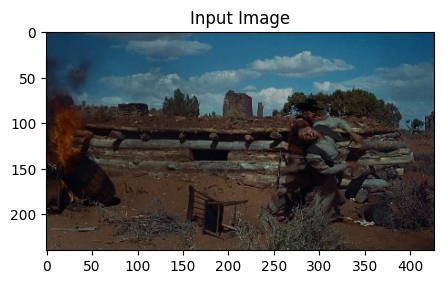

In [23]:
#frame = image_data["frame"][6716]
frame = image_data["frame"][2400]
#visualize frame using plt
img = cv2.imread(os.path.join("extracted_frames", frame))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.title("Input Image")
plt.imshow(img)
plt.show()

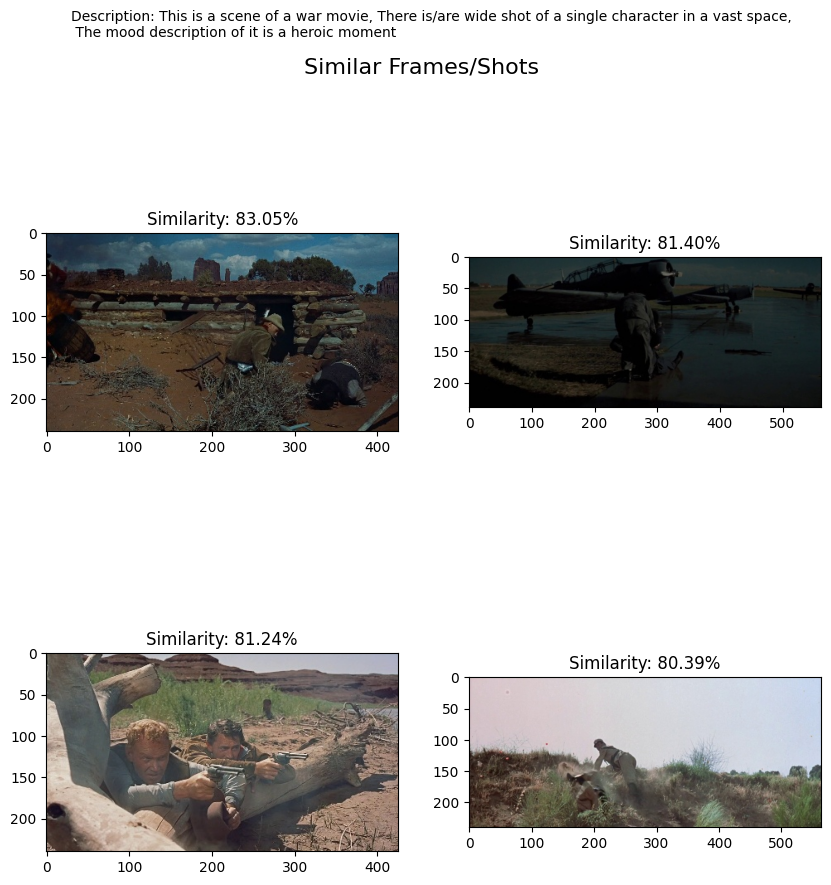

In [24]:
image_embedding, brightness, contrast, scene_type, emotion, character, description, color = get_img_embeddings(image_data, frame)

# Run the similarity search
top_images = get_top_N_images(frame, image_data, image_embedding, "image_embedding")

# Plot the recommended images
plot_images_by_side(top_images, description)